In [ ]:
라이브러리 임포트

In [1]:
import numpy as np
from skimage import img_as_float, exposure, img_as_ubyte
from skimage.color import rgb2gray
from skimage.io import imread
from skimage.restoration import denoise_bilateral, denoise_nl_means, \
								  estimate_sigma
from skimage.measure import compare_psnr
from skimage.util import random_noise
from PIL import Image, ImageEnhance, ImageFilter
from scipy import ndimage
import matplotlib.pylab as pylab

In [ ]:
로그 변환 - 색상 채널 히스토그램

In [2]:
# 영상 표시 함수
def plot_image(image, title=''):
    pylab.title(title, size=20), pylab.imshow(image)
    pylab.axis('off') # 그래프에 축 보이기 원한다면 이 라인 주석처리
    
# 히스토그램 그리기 함수
def plot_hist(r, g, b, title=''):
    r, g, b = img_as_ubyte(r), img_as_ubyte(g), img_as_ubyte(b)    
    r, g, b = np.array(r).ravel(), np.array(g).ravel(), np.array(b).ravel()    
    pylab.hist(r, bins=256, range=(0, 256), color='r', alpha=0.5)
    pylab.hist(g, bins=256, range=(0, 256), color='g', alpha=0.5)
    pylab.hist(b, bins=256, range=(0, 256), color='b', alpha=0.5)
    pylab.xlabel('pixel value', size=20)
    pylab.ylabel('frequency',size=20), pylab.title(title, size=20)

In [ ]:
하프-토닝

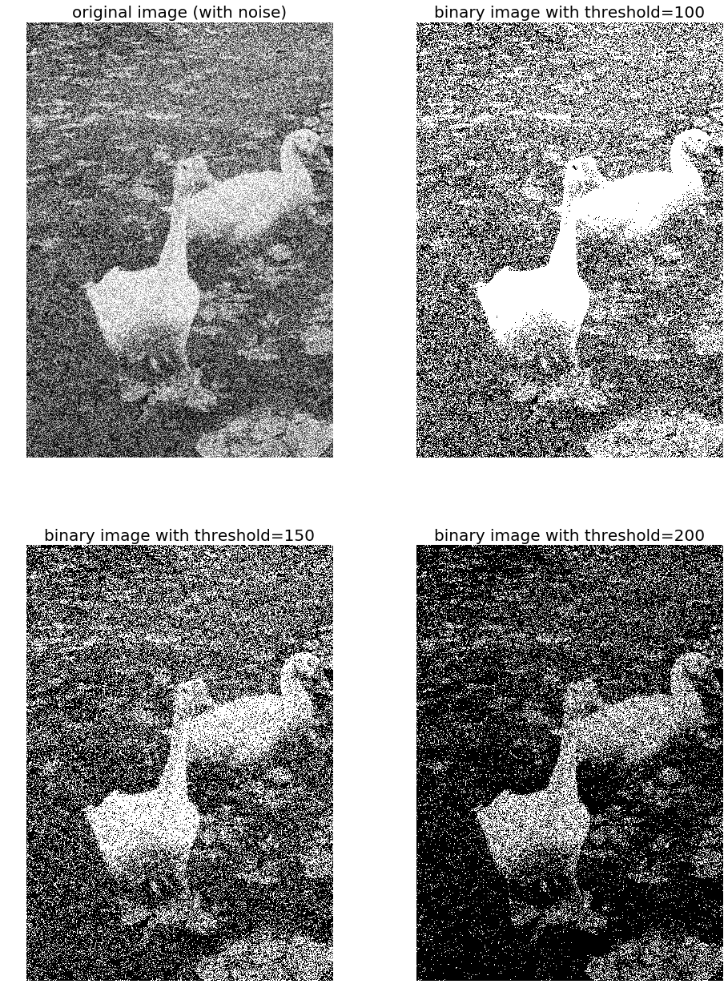

In [31]:
im = Image.open('../images/swans.jpg').convert('L')
im += np.random.randint(-128, 128, (im.height, im.width))
im = Image.fromarray(np.clip(im, 0, 255).astype(np.uint8))

pylab.figure(figsize=(16,22))
pylab.subplot(221), plot_image(im, 'original image (with noise)')
pylab.gray()

for i, th, in enumerate([100, 150, 200]):
    im1 = im.point(lambda x: x > th)
    pylab.subplot(2,2,i+2)
    plot_image(im1, 'binary image with threshold=' + str(th))
pylab.show()

In [ ]:
Scikit-image를 이용한 콘트라스트 스트레칭과 히스토그램 평활화

C:\Users\bae22\Anaconda3\lib\site-packages\skimage\util\dtype.py:141: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


<Figure size 432x288 with 0 Axes>

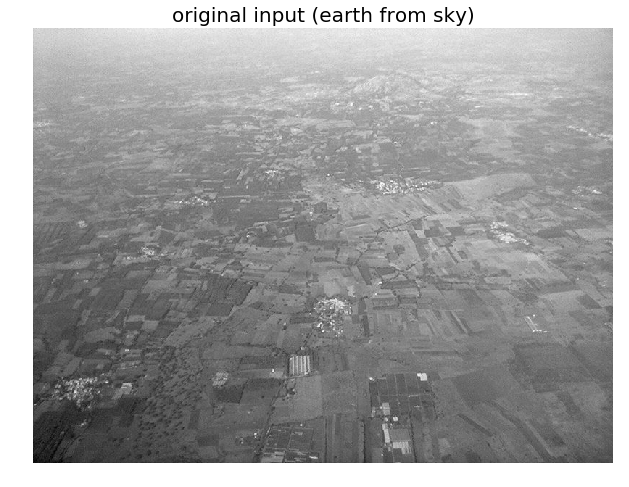

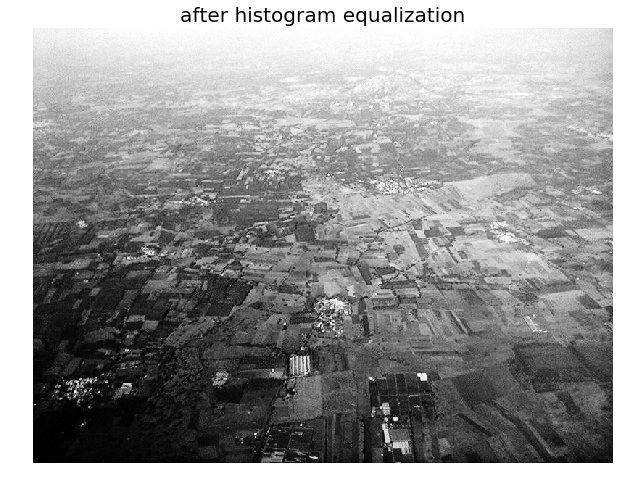

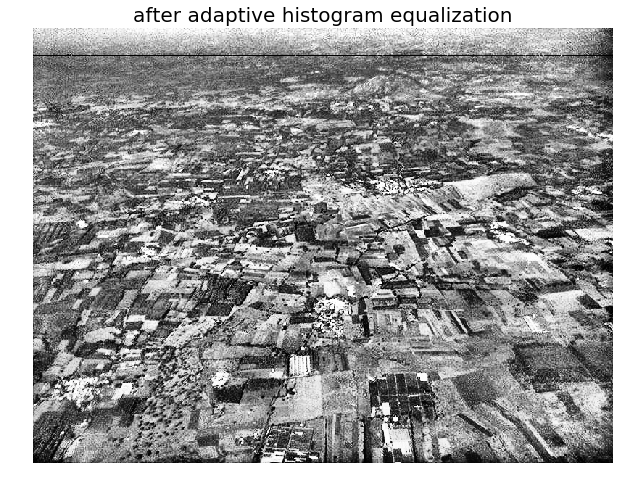

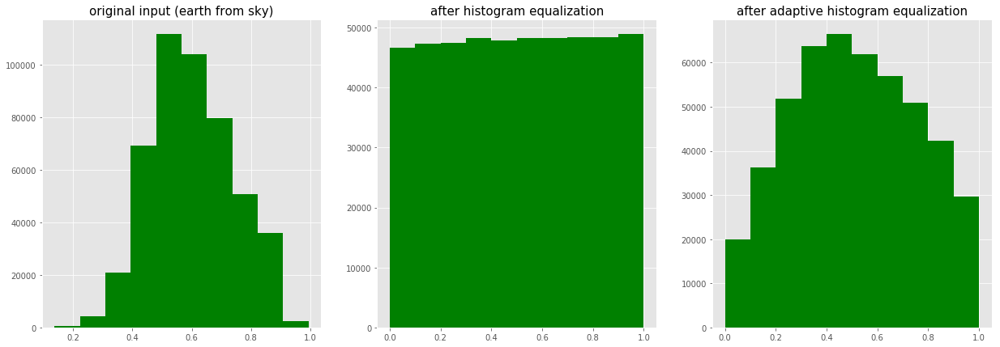

In [32]:
img = rgb2gray(imread('../images/earthfromsky.jpg'))
img_eq = exposure.equalize_hist(img)  			 			# 전역 히스토그램 평활화
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03) # 지역적 평활화
images = [img, img_eq, img_adapteq]  			 			# 영상 리스트

titles = ['original input (earth from sky)', \
          'after histogram equalization', \
          'after adaptive histogram equalization']  			# 그래프 영상 타이틀

pylab.gray()
for i in range(3):
    pylab.figure(figsize=(12,8)), plot_image(images[i], titles[i])

pylab.figure(figsize=(21,7))
for i in range(3):
    pylab.subplot(1,3,i+1), pylab.title(titles[i], size=15)
    pylab.hist(images[i].ravel(), color='g')
pylab.show()

In [ ]:
히스토그램 처리 기술로 영상 향상

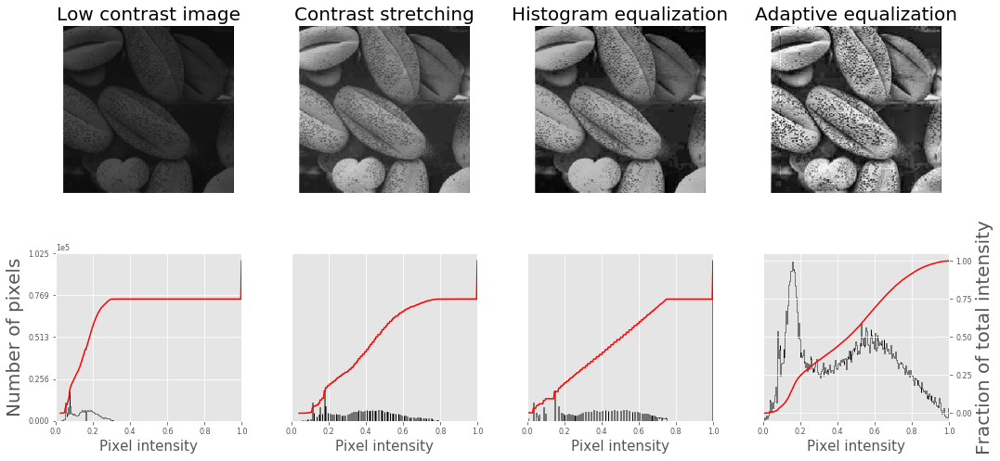

In [42]:
import matplotlib
def plot_image_and_hist(image, axes, bins=256):
    image = img_as_float(image)
    axes_image, axes_hist = axes
    axes_cdf = axes_hist.twinx()    
    axes_image.imshow(image, cmap=pylab.cm.gray)
    axes_image.set_axis_off()
    
    axes_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    axes_hist.set_xlim(0, 1)
    axes_hist.set_xlabel('Pixel intensity', size=15)
    axes_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    axes_hist.set_yticks([])

    image_cdf, bins = exposure.cumulative_distribution(image, bins)
    axes_cdf.plot(bins, image_cdf, 'r')
    axes_cdf.set_yticks([])
    return axes_image, axes_hist, axes_cdf

im = imread('../images/beans_g.png')
im_rescale = exposure.rescale_intensity(im, in_range=(2, 98)) # 대조 스트레칭
im_eq = exposure.equalize_hist(im) # 히스토그램 평활화
im_adapteq = exposure.equalize_adapthist(im, clip_limit=0.03)# 적응적 평활화

matplotlib.rcParams['font.size'] = 8
fig = pylab.figure(figsize=(15, 7))
axes = np.zeros((2, 4), dtype = np.object)

for i in range(0, 4):
    axes[0, i] = fig.add_subplot(2, 4, i+1)
    axes[1, i] = fig.add_subplot(2, 4, i+5)
    
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im, axes[:, 0])
axes_image.set_title('Low contrast image', size=20)
y_min, y_max = axes_hist.get_ylim()
axes_hist.set_ylabel('Number of pixels', size=20)
axes_hist.set_yticks(np.linspace(0, y_max, 5))

axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_rescale, axes[:,1])
axes_image.set_title('Contrast stretching', size=20)
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_eq, axes[:, 2])
axes_image.set_title('Histogram equalization', size=20)
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_adapteq, axes[:,3])
axes_image.set_title('Adaptive equalization', size=20)
axes_cdf.set_ylabel('Fraction of total intensity', size=20)

axes_cdf.set_yticks(np.linspace(0, 1, 5))
fig.tight_layout()
pylab.show()

In [ ]:
히스토그램 매칭

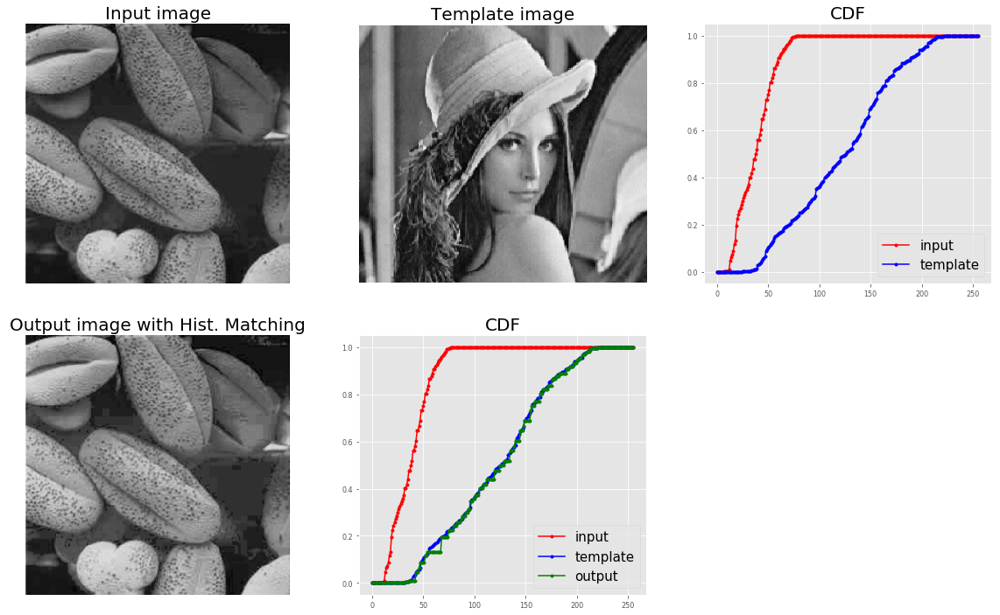

In [43]:
def cdf(im):
    ''' 2D ndarray로서 im 영상의 CDF 계산 '''
    c, b = exposure.cumulative_distribution(im)
    c = np.insert(c, 0, [0]*b[0])
    
    c = np.append(c, [1]*(255-b[-1]))
    return c

def hist_matching(c, c_t, im):
    '''
    c: cdf() 함수로 계산된 입력 영상의 CDF
    c_t: cdf() 함수로 계산된 템플릿 영상의 CDF
    im: 2D numpy ndarray로서 입력 영상
    반환 값은 입력 영상에 대해 수정된 화소 값들
    '''
    # 탬플릿 영상의 CDF H 값이 주어지면, 입력 영상의 CDF에 상응하는
    # 가장 가까운 화소 매칭 검색 c_t = H(pixels) <=> pixels = H-1(c_t)
    pixels = np.arange(256)
    new_pixels = np.interp(c, c_t, pixels)
    im = (np.reshape(new_pixels[im.ravel()], im.shape)).astype(np.uint8)
    return im

im = (rgb2gray(imread('../images/beans_g.png'))*255).astype(np.uint8)
im_t = (rgb2gray(imread('../images/lena_g.png'))*255).astype(np.uint8)
c, c_t = cdf(im), cdf(im_t)

im1 = hist_matching(c, c_t, im)
c1 = cdf(im1)

p = np.arange(256)
pylab.figure(figsize=(20,12)), pylab.gray()
pylab.subplot(2,3,1), plot_image(im, 'Input image')
pylab.subplot(2,3,2), plot_image(im_t, 'Template image')
pylab.subplot(2,3,3)
pylab.plot(p, c, 'r.-', label='input')
pylab.plot(p, c_t, 'b.-', label='template')
pylab.legend(prop={'size': 15}), pylab.title('CDF', size=20)

pylab.subplot(2,3,4)
plot_image(im1, 'Output image with Hist. Matching')
pylab.subplot(2,3,5)
pylab.plot(p, c, 'r.-', label='input')
pylab.plot(p, c_t, 'b.-', label='template')
pylab.plot(p, c1, 'g.-', label='output')
pylab.legend(prop={'size': 15}), pylab.title('CDF', size=20)
pylab.show()

In [ ]:
ImageFilter.BLUR를 사용한 평활화

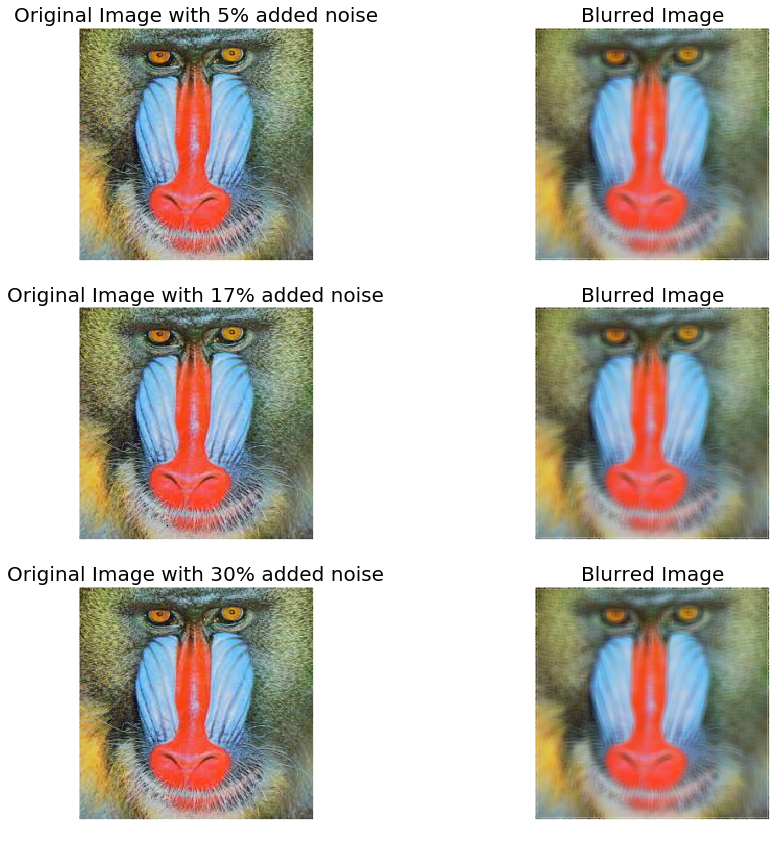

In [44]:
def salt_pepper_noise(im, n):
    x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
    for (x,y) in zip(x,y):
        pix = ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))
    im.putpixel((x, y), pix)

i = 1
pylab.figure(figsize=(15,30))
for prop_noise in np.linspace(0.05, 0.3, 3):
    im = Image.open('../images/mandrill.jpg')
    n = int(im.width * im.height * prop_noise) # 잡음 개수
    salt_pepper_noise(im, n)
    
    im.save('../images/mandrill_spnoise_' + str(prop_noise) + '.jpg')
    title = 'Original Image with ' + str(int(100*prop_noise)) + '% added noise'
    pylab.subplot(6,2,i), plot_image(im, title)
    i += 1
    im1 = im.filter(ImageFilter.BLUR)
    pylab.subplot(6,2,i), plot_image(im1, 'Blurred Image')
    i += 1
    
pylab.show()

In [ ]:
가우시안 블러 필터로 평활화

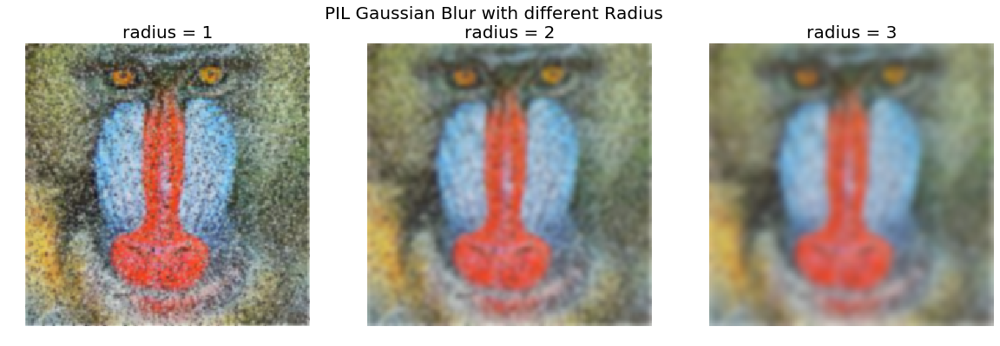

In [45]:
im = Image.open('../images/mandrill_spnoise_0.2.jpg')
pylab.figure(figsize=(20,6))
for radius in range(1, 4):
    im1 = im.filter(ImageFilter.GaussianBlur(radius))
    pylab.subplot(1,3,radius), plot_image(im1, 'radius = ' + str(radius))
    
pylab.suptitle('PIL Gaussian Blur with different Radius', size=20)
pylab.show()

In [ ]:
SciPy ndimage를 사용한 박스 커널과 가우시안 커널의 평활화 비교

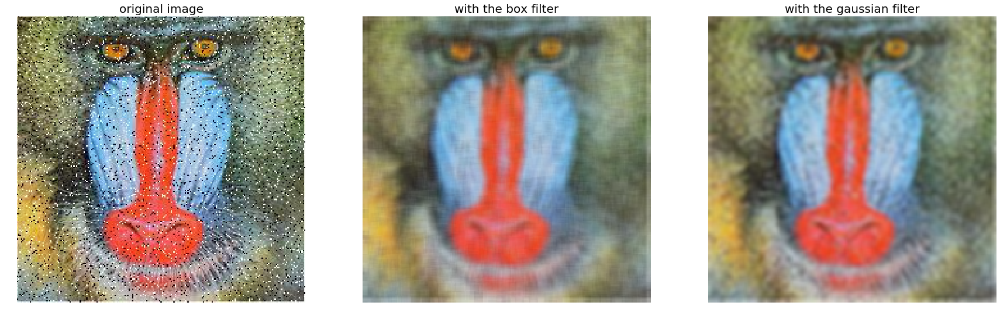

In [46]:
from scipy import ndimage
im = imread('../images/mandrill_spnoise_0.1.jpg')
k, s = 7, 2 							# 커널 크기 7 × 7 , 표준 편차 2
im_box = ndimage.uniform_filter(im, size=(k,k,1))
t = (((k - 1)/2)-0.5)/s 				# 커널 크기와 표준 편차로 truncate 파라미터 계산
im_gaussian = ndimage.gaussian_filter(im, sigma=(s, s, 0), truncate=t)

fig = pylab.figure(figsize=(30,10))
pylab.subplot(131), plot_image(im, 'original image')
pylab.subplot(132), plot_image(im_box, 'with the box filter')
pylab.subplot(133), plot_image(im_gaussian, 'with the gaussian filter')
pylab.show()

In [ ]:
메디안 필터 사용

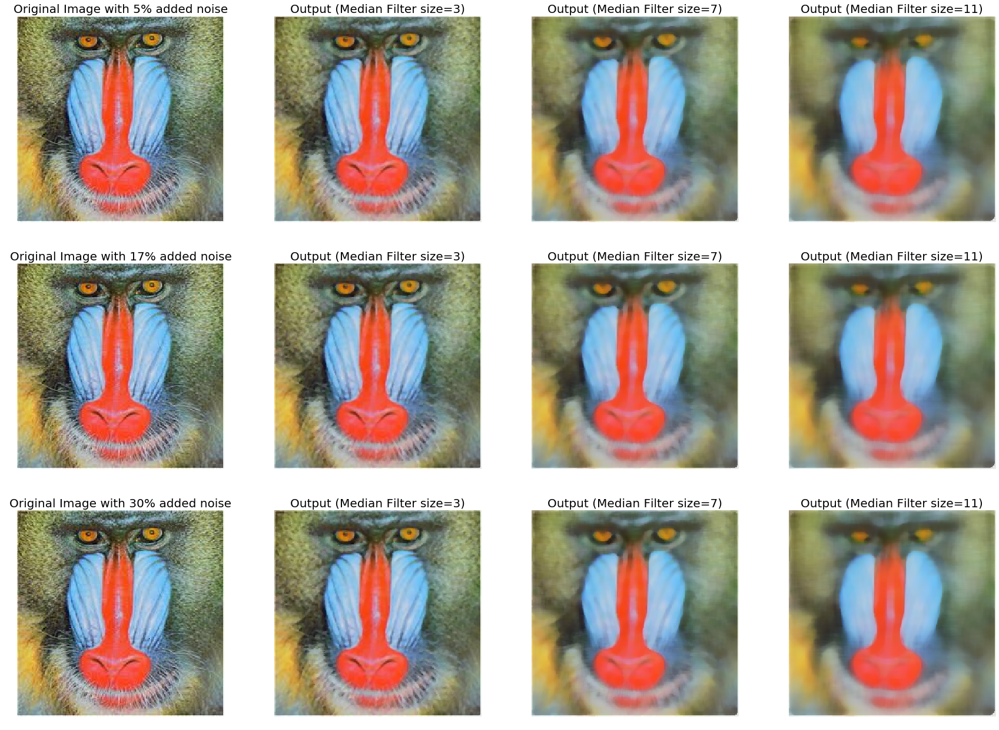

In [51]:
i = 1
pylab.figure(figsize=(30,45))

for prop_noise in np.linspace(0.05, 0.3, 3):
    im = Image.open('../images/mandrill.jpg')
    n = int(im.width * im.height * prop_noise)
    salt_pepper_noise(im, n)
    
    im.save('../images/mandrill_spnoise_' + str(prop_noise) + '.jpg')
    pylab.subplot(6, 4, i)
    title = str(int(100*prop_noise)) + '% added noise'
    plot_image(im, 'Original Image with ' + title)
    i += 1
    
    for sz in [3,7,11]:
        im1 = im.filter(ImageFilter.MedianFilter(size=sz))
        pylab.subplot(6,4,i)
        plot_image(im1, 'Output (Median Filter size=' + str(sz) + ')')
        i += 1
pylab.show()

In [ ]:
최대 및 최소 필터 사용

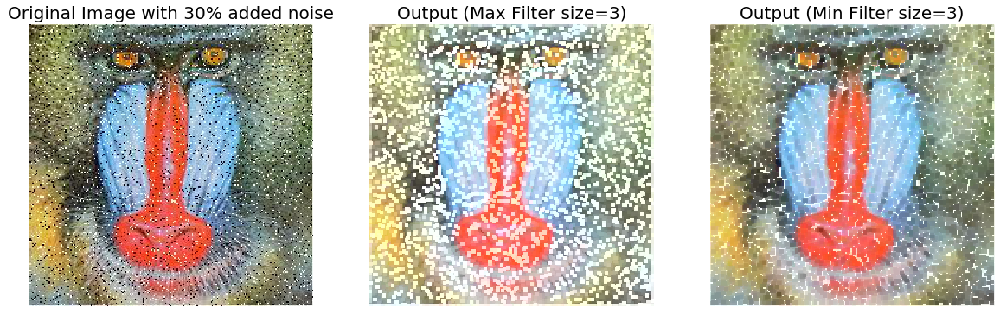

In [3]:
im = Image.open('../images/mandrill_spnoise_0.1.jpg')
sz = 3
im1 = im.filter(ImageFilter.MaxFilter(size=sz))
im2 = im1.filter(ImageFilter.MinFilter(size=sz))

pylab.figure(figsize=(20,35))
pylab.subplot(1,3,1), plot_image(im, 'Original Image with 30% added noise')
pylab.subplot(1,3,2), plot_image(im1, 'Output (Max Filter size=' + str(sz)+ ')')
pylab.subplot(1,3,3), plot_image(im2, 'Output (Min Filter size=' + str(sz)+ ')')
pylab.show()

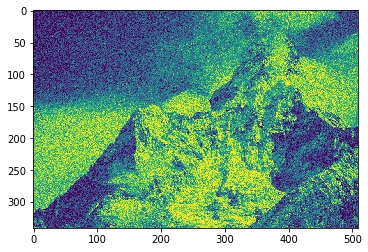

In [4]:
im = rgb2gray(img_as_float(imread('../images/mountain.png')))
sigma = 0.155
noisy = random_noise(im, var=sigma**2)
pylab.imshow(noisy)

In [ ]:
양방향 필터

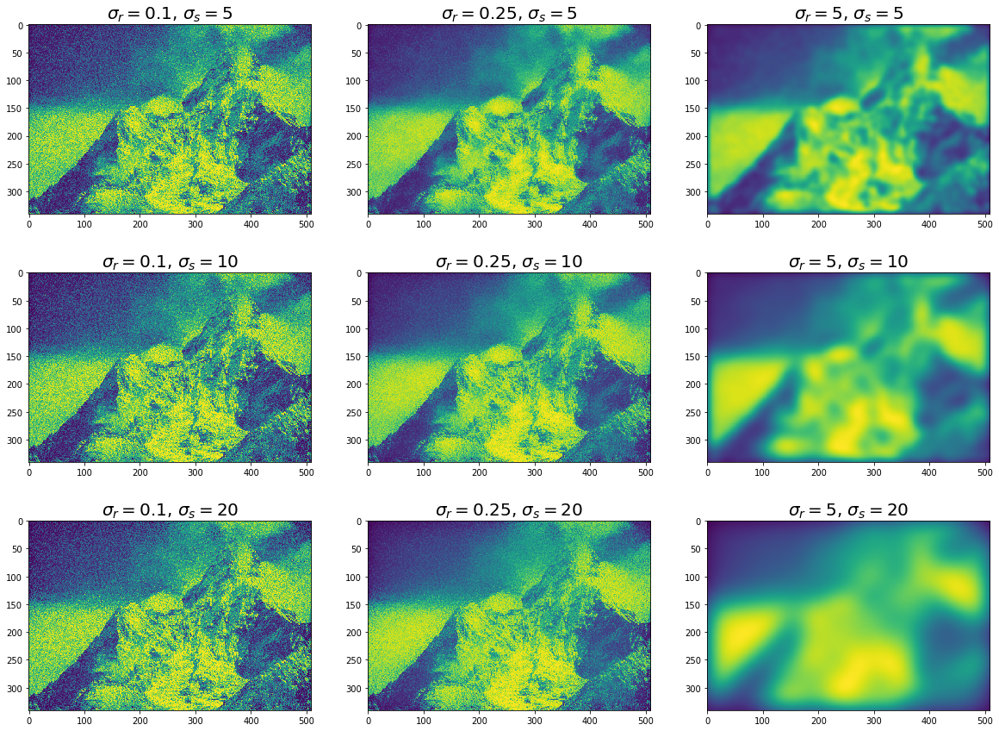

In [5]:
pylab.figure(figsize=(20,15))
i = 1
for sigma_sp in [5, 10, 20]:
    for sigma_col in [0.1, 0.25, 5]:
        pylab.subplot(3,3,i)
        pylab.imshow(denoise_bilateral(noisy, sigma_color=sigma_col, \
                                       sigma_spatial=sigma_sp, multichannel=False))
        pylab.title(r'$\sigma_r=$' + str(sigma_col) + \
                    r', $\sigma_s=$' + str(sigma_sp), size=20)
        i += 1
pylab.show()

In [ ]:
비-로컬 평균 사용

estimated noise standard deviation = 0.22126677681680618
PSNR (noisy) = 13.02
PSNR (slow) = 25.91
PSNR (fast) = 25.56


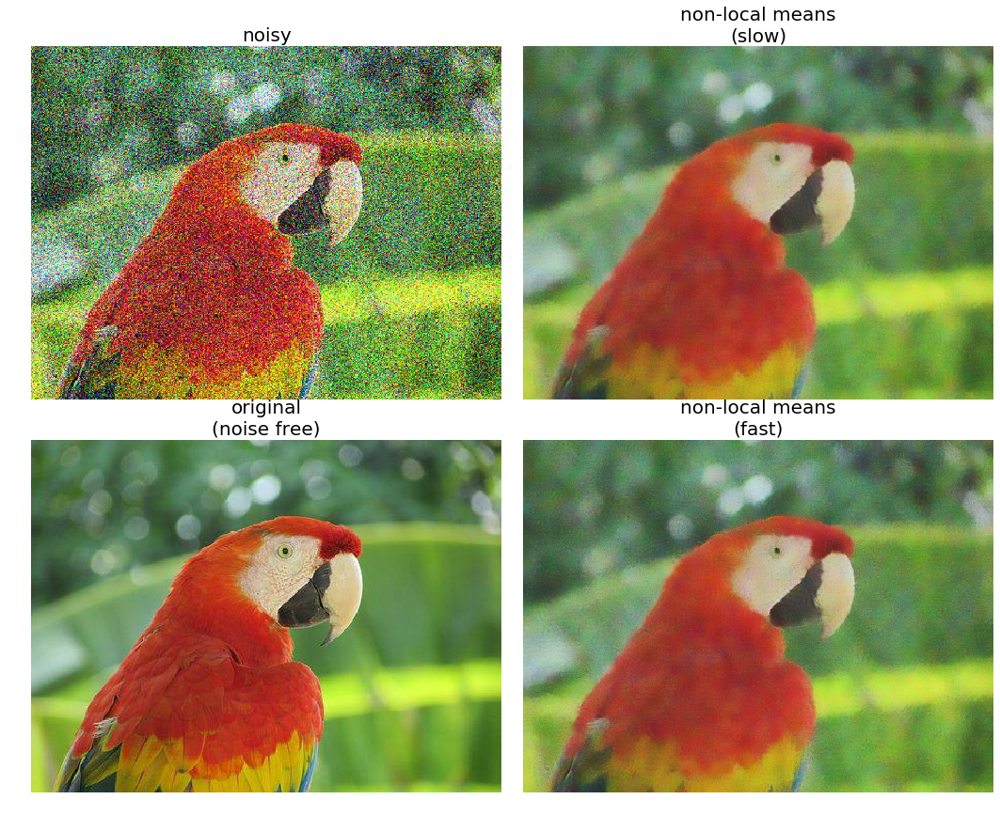

In [6]:
def plot_image_axes(image, axes, title):
    axes.imshow(image)
    axes.axis('off')
    axes.set_title(title, size=20)
    
parrot = img_as_float(imread('../images/parrot.png'))
sigma = 0.25
noisy = parrot + sigma * np.random.standard_normal(parrot.shape)
noisy = np.clip(noisy, 0, 1)

# 잡음 영상에서 잡음 표준 편차 추정
sigma_est = np.mean(estimate_sigma(noisy, multichannel=True))
print("estimated noise standard deviation = {}".format(sigma_est))
# estimated noise standard deviation = 0.22048519002358943
patch_kw = dict(patch_size=5,     				# 5 × 5 패치 크기
                patch_distance=6, 				# 13 × 13 검색 영역
                multichannel=True)

# slow algorithm
denoise = denoise_nl_means(noisy, h=1.15 * sigma_est, fast_mode=False, \
                           **patch_kw)
# fast algorithm
denoise_fast = denoise_nl_means(noisy, h=0.8 * sigma_est, \
                                fast_mode=True, **patch_kw)
fig, axes = pylab.subplots(nrows=2, ncols=2, figsize=(15, 12), \
                           sharex=True, sharey=True)
plot_image_axes(noisy, axes[0, 0], 'noisy')
plot_image_axes(denoise, axes[0, 1], 'non-local means\n(slow)')
plot_image_axes(parrot, axes[1, 0], 'original\n(noise free)')
plot_image_axes(denoise_fast, axes[1, 1], 'non-local means\n(fast)')
fig.tight_layout()
                
# PSNR metric values
psnr_noisy = compare_psnr(parrot, noisy)
psnr = compare_psnr(parrot, denoise.astype(np.float64))
psnr_fast = compare_psnr(parrot, denoise_fast.astype(np.float64))
print("PSNR (noisy) = {:0.2f}".format(psnr_noisy))
print("PSNR (slow) = {:0.2f}".format(psnr))
print("PSNR (fast) = {:0.2f}".format(psnr_fast))
# PSNR (noisy) = 13.03 # PSNR (slow) = 26.25 # PSNR (fast) = 25.84
pylab.show()

In [ ]:
Scipy ndimage를 사용한 평활화

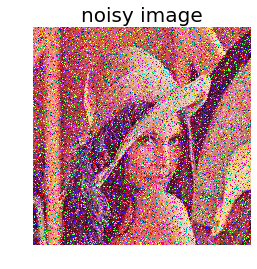

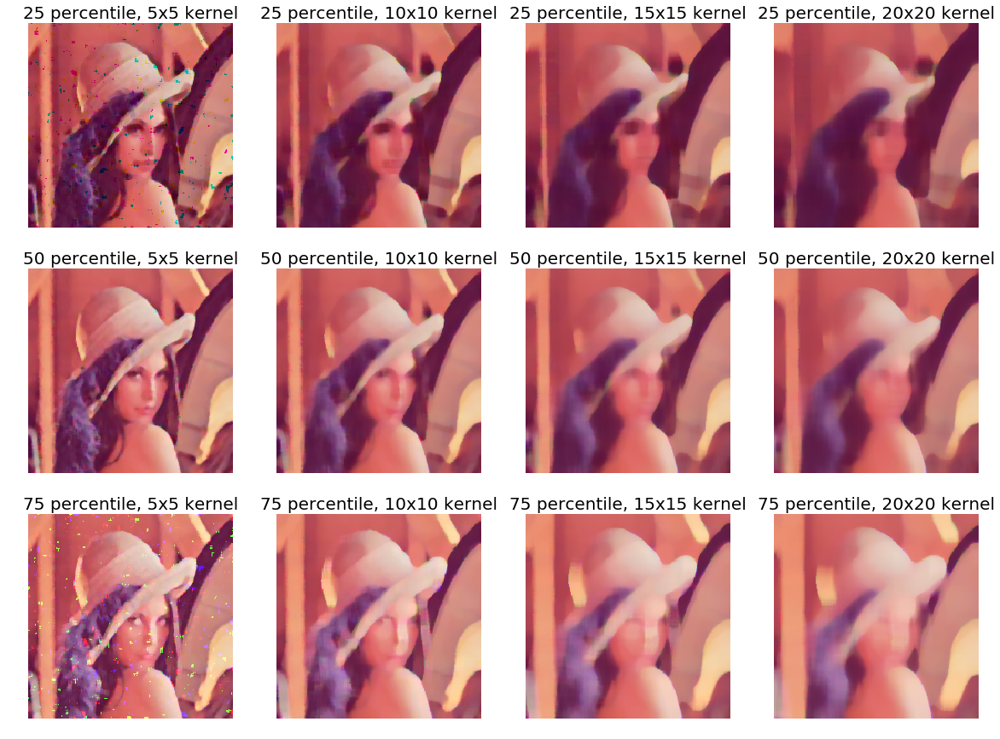

In [7]:
lena = imread('../images/lena.jpg')
noise = np.random.random(lena.shape) # 입력 영상에 소금 후추 잡음 추가
lena[noise > 0.9] = 255
lena[noise < 0.1] = 0
plot_image(lena, 'noisy image')
pylab.show()

fig = pylab.figure(figsize=(20,15))
i = 1
for p in range(25, 100, 25):
    for k in range(5, 25, 5):
        pylab.subplot(3,4,i)
        filtered = ndimage.percentile_filter(lena, percentile=p, size=(k,k,1))
        plot_image(filtered, str(p) + ' percentile, ' + str(k) + 'x' + \
                   str(k) + ' kernel')
        i += 1
pylab.show()